# [DRAFT] Compare performances of TTM on Buildings 900K

Chronos already tested, comparison

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import math
import os
import tempfile

import pandas as pd
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from transformers import EarlyStoppingCallback, Trainer, TrainingArguments, set_seed
from transformers.integrations import INTEGRATION_TO_CALLBACK

from tsfm_public import TimeSeriesPreprocessor, TrackingCallback, count_parameters, get_datasets
from tsfm_public.toolkit.get_model import get_model
from tsfm_public.toolkit.lr_finder import optimal_lr_finder
from tsfm_public.toolkit.visualization import plot_predictions

import datasets
from datasets import Dataset
import numpy as np

In [2]:
import warnings


# Suppress all warnings
warnings.filterwarnings("ignore")

---

## Data processing

In [3]:
TTM_MODEL_PATH = "ibm-granite/granite-timeseries-ttm-r2"
# Set seed for reproducibility
SEED = 41
set_seed(SEED)

# Results dir
OUT_DIR = "ttm_finetuned_models/"
dataset_name = "buildings_900K"

context_length=512 
forecast_length=64
batch_size=64

pd_batch_size = 1000

# Dataset
timestamp_column = "timestamp"
id_columns = ["item_id"]  # mention the ids that uniquely identify a time-series.

target_columns = ["target"]
split_config = {
    "train": [
        0,
        4000,
    ],
    "valid": [
        4000,
        8761-forecast_length,
    ],
    "test": [
        8761-forecast_length, # the context length is included by the splitter
        8761,
    ],
}
# Understanding the split config -- slides

column_specifiers = {
    "timestamp_column": timestamp_column,
    "id_columns": id_columns,
    "target_columns": target_columns,
    "control_columns": [],
}


In [4]:
split_config

{'train': [0, 4000], 'valid': [4000, 8697], 'test': [8697, 8761]}

In [49]:
files_test = ["../../../chronos-forecasting/data/buildings_900K_chronos_split_ttm/domain_shift/data-00000-of-00001.arrow"]
ds_test = datasets.load_dataset(
    "arrow", data_files={'train': files_test}, split="train"
)

Generating train split: 0 examples [00:00, ? examples/s]

In [6]:
features = ds_test.features
features

{'item_id': Value(dtype='string', id=None),
 'start': Value(dtype='timestamp[s]', id=None),
 'freq': Value(dtype='string', id=None),
 'target': Sequence(feature=Value(dtype='float32', id=None), length=-1, id=None),
 'building_type': Value(dtype='string', id=None),
 'weather_year': Value(dtype='string', id=None),
 'broader_region': Value(dtype='string', id=None),
 'puma': Value(dtype='string', id=None),
 'building_id': Value(dtype='string', id=None),
 'group': Value(dtype='string', id=None),
 'timestamp': Sequence(feature=Value(dtype='timestamp[us]', id=None), length=-1, id=None)}

In [7]:
df_test = ds_test.to_pandas(batch_size=pd_batch_size, batched=True)

In [8]:
df_test

<generator object Dataset.to_pandas.<locals>.<genexpr> at 0x775de55bd690>

INFO:p-1305069:t-131252613006464:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-1305069:t-131252613006464:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-1305069:t-131252613006464:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96


(1000, 64, 1)


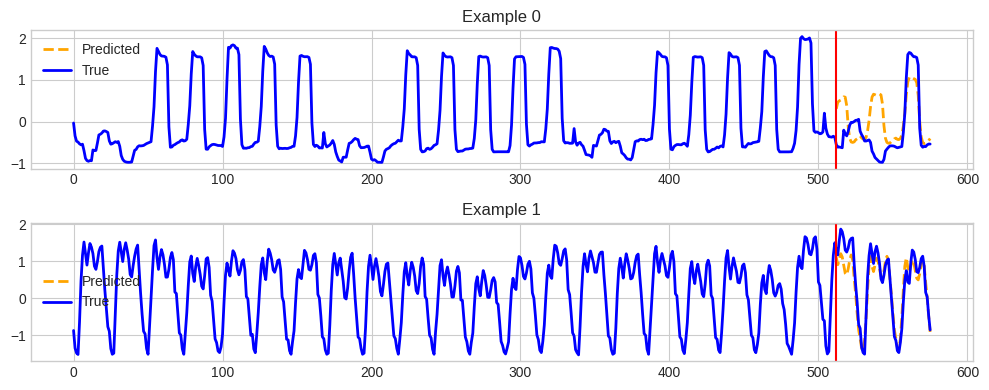

In [9]:
for sub_df_test in df_test:
    sub_df_test_exploded = sub_df_test.explode(["target", "timestamp"], ignore_index=True)
    big_stride = len(sub_df_test_exploded) # Big stride to get only one window, it's the first but it's ok since the test is cut on the last segment of the time series anyway

    tsp = TimeSeriesPreprocessor(
        **column_specifiers,
        context_length=context_length,
        prediction_length=forecast_length,
        scaling=True,
        encode_categorical=False,
        scaler_type="standard",
    )

    # Load model
    zeroshot_model = get_model(
        TTM_MODEL_PATH,
        context_length=context_length,
        prediction_length=forecast_length,
        freq_prefix_tuning=False,
        freq=None,
        prefer_l1_loss=False,
        prefer_longer_context=True,
    )

    dset_train, dset_valid, dset_test = get_datasets(
        tsp, sub_df_test_exploded, split_config, use_frequency_token=zeroshot_model.config.resolution_prefix_tuning, stride=big_stride,
    )

    temp_dir = tempfile.mkdtemp()
    # zeroshot_trainer
    zeroshot_trainer = Trainer(
        model=zeroshot_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=batch_size,
            seed=SEED,
            report_to="none",
        ),
    )
    

    # get predictions

    predictions_dict = zeroshot_trainer.predict(dset_test)

    predictions_np = predictions_dict.predictions[0]

    print(predictions_np.shape)

    # evaluate = zero-shot performance
    

    # plot
    plot_predictions(
        model=zeroshot_trainer.model,
        dset=dset_test,
        plot_dir=os.path.join(OUT_DIR, dataset_name),
        plot_prefix="test_zeroshot",
        plot_context=context_length,
        indices=[0, 1],
        channel=0,
    )

    break

In [10]:
big_stride

8761000

In [11]:
dset_train.datasets[0].X

,target
0,-0.545961
1,0.307997
2,0.630494
3,0.678910
4,0.656187
...,...
3995,-0.977501
3996,-0.977501
3997,-0.977501
3998,-0.977501


In [12]:
dset_valid.datasets[0].X

,target
0,-0.977501
1,-0.977501
2,-0.977501
3,-0.977501
4,-0.977501
...,...
5204,-0.361395
5205,-0.368742
5206,-0.374271
5207,-0.351535


In [13]:
dset_test.datasets[0].X

,target
0,-0.035521
1,-0.343486
2,-0.470476
3,-0.491080
4,-0.533461
...,...
571,-0.597098
572,-0.600157
573,-0.559313
574,-0.539140


In [14]:
dset_test.datasets[0].X.to_numpy().flatten()

array([-3.55206010e-02, -3.43486201e-01, -4.70475911e-01, -4.91080001e-01,
       -5.33460662e-01, -5.56603619e-01, -5.42920367e-01, -6.97345057e-01,
       -8.81037356e-01, -9.34908318e-01, -9.51590853e-01, -9.34402208e-01,
       -9.39692049e-01, -6.80771849e-01, -6.97482599e-01, -6.92747051e-01,
       -5.16454271e-01, -3.21107745e-01, -3.03663000e-01, -2.75595235e-01,
       -2.28850409e-01, -2.24156169e-01, -2.39380076e-01, -2.61922457e-01,
       -4.62435750e-01, -5.42265520e-01, -5.30596957e-01, -5.06336510e-01,
       -4.83399506e-01, -4.98862884e-01, -4.79541517e-01, -5.92653150e-01,
       -8.13919270e-01, -9.05111947e-01, -9.49599471e-01, -9.65891572e-01,
       -9.74217226e-01, -9.76030347e-01, -9.74724580e-01, -9.69574900e-01,
       -8.30079001e-01, -6.88116312e-01, -6.67653299e-01, -6.06431981e-01,
       -5.79528185e-01, -5.83808555e-01, -5.80197173e-01, -5.72849502e-01,
       -5.51602021e-01, -5.28231899e-01, -5.13985844e-01, -4.97030254e-01,
       -4.82905375e-01, -

In [15]:
# Should be True : the test set is the last segment of the time series
context_length + forecast_length == dset_test.datasets[0].X.shape[0]

True

In [16]:
# Number of windows in the sets
len(dset_test.datasets[0]), len(dset_train.datasets[0]), type(dset_valid.datasets[0]), type(dset_train.datasets[0])

(1,
 1,
 tsfm_public.toolkit.dataset.ForecastDFDataset.BaseForecastDFDataset,
 tsfm_public.toolkit.dataset.ForecastDFDataset.BaseForecastDFDataset)

In [17]:
dset_test.datasets[0][0].keys()

dict_keys(['past_values', 'future_values', 'past_observed_mask', 'future_observed_mask', 'timestamp', 'id'])

In [18]:
dset_test.datasets[0][0]['timestamp'], dset_test.datasets[-1][0]['timestamp']

(Timestamp('2018-12-29 08:00:00'), Timestamp('2018-12-29 08:00:00'))

In [19]:
dset_train.datasets[0][0]['timestamp'], dset_train.datasets[-1][0]['timestamp']

(Timestamp('2018-01-22 07:00:00'), Timestamp('2018-01-22 07:00:00'))

In [20]:
# The timestamp returned by the dset_train seems to be the end of the context
sub_df_test.iloc[0]['start'].to_period(freq='H'), sub_df_test.iloc[0]['start'].to_period(freq='H') + context_length - 1 # -1 to get the last timestamp of the context

(Period('2018-01-01 00:00', 'h'), Period('2018-01-22 07:00', 'h'))

In [21]:
# The timestamp associated to the dstest is the end of the context too for the last window
sub_df_test.iloc[0]['start'].to_period(freq='H') + (8761 - forecast_length - 1)

Period('2018-12-29 08:00', 'h')

In [22]:
len(dset_test.datasets[0][0]['past_values']), len(dset_test.datasets[0][0]['future_values'])

(512, 64)

---

Trying to use gluonts code to compare Chronos results to TTM results

In [23]:
from gluonts.model.forecast import SampleForecast

In [24]:
predictions_dict.predictions[0].shape

(1000, 64, 1)

In [25]:
last_predictions = predictions_dict.predictions[0].squeeze(2)
last_predictions.shape

(1000, 64)

In [26]:
last_predictions = np.expand_dims(last_predictions, axis=1)
last_predictions.shape

(1000, 1, 64)

In [27]:
start_date = dset_test.datasets[0][0]['timestamp']
start_date

Timestamp('2018-12-29 08:00:00')

In [28]:
start_date = start_date.to_period(freq='H') + 1 # +1 ?
start_date

Period('2018-12-29 09:00', 'h')

In [29]:
# I believe +1 is needed
sub_df_test.iloc[0]['timestamp'][-64:]

array(['2018-12-29T09:00:00.000000', '2018-12-29T10:00:00.000000',
       '2018-12-29T11:00:00.000000', '2018-12-29T12:00:00.000000',
       '2018-12-29T13:00:00.000000', '2018-12-29T14:00:00.000000',
       '2018-12-29T15:00:00.000000', '2018-12-29T16:00:00.000000',
       '2018-12-29T17:00:00.000000', '2018-12-29T18:00:00.000000',
       '2018-12-29T19:00:00.000000', '2018-12-29T20:00:00.000000',
       '2018-12-29T21:00:00.000000', '2018-12-29T22:00:00.000000',
       '2018-12-29T23:00:00.000000', '2018-12-30T00:00:00.000000',
       '2018-12-30T01:00:00.000000', '2018-12-30T02:00:00.000000',
       '2018-12-30T03:00:00.000000', '2018-12-30T04:00:00.000000',
       '2018-12-30T05:00:00.000000', '2018-12-30T06:00:00.000000',
       '2018-12-30T07:00:00.000000', '2018-12-30T08:00:00.000000',
       '2018-12-30T09:00:00.000000', '2018-12-30T10:00:00.000000',
       '2018-12-30T11:00:00.000000', '2018-12-30T12:00:00.000000',
       '2018-12-30T13:00:00.000000', '2018-12-30T14:00:00.0000

In [30]:
forecasts = [SampleForecast(samples=last_prediction, start_date=start_date) for last_prediction in last_predictions]
forecasts

[gluonts.model.forecast.SampleForecast(info=None, item_id=None, samples=array([[ 0.30479902,  0.46188423,  0.4957702 ,  0.51307124,  0.5502262 ,
          0.59202975,  0.5828558 ,  0.37809685, -0.12489201, -0.40018672,
         -0.48974094, -0.50081897, -0.486751  , -0.4381357 , -0.4132679 ,
         -0.36359408, -0.34677452, -0.39128688, -0.41921645, -0.42452416,
         -0.38122848, -0.2235306 ,  0.02210461,  0.3541528 ,  0.58623856,
          0.6544648 ,  0.6411148 ,  0.6242784 ,  0.6300177 ,  0.6593847 ,
          0.63725847,  0.420356  , -0.10293408, -0.40082905, -0.5003399 ,
         -0.5200637 , -0.5141619 , -0.47664735, -0.46062052, -0.41399172,
         -0.3968982 , -0.42721602, -0.43301868, -0.40559745, -0.3227681 ,
         -0.10849887,  0.21692336,  0.6345483 ,  0.9450094 ,  1.0589777 ,
          1.0708938 ,  1.0467398 ,  1.0263584 ,  1.0114911 ,  0.92749786,
          0.6213636 ,  0.00341959, -0.36692306, -0.49793777, -0.528825  ,
         -0.51782864, -0.4783949 , -0.457

In [31]:
from gluonts.model.evaluation import evaluate_forecasts
from gluonts.ev.metrics import MASE, MeanWeightedSumQuantileLoss

In [32]:
def to_gluonts_univariate(hf_dataset: datasets.Dataset):
    series_fields = [
        col
        for col in hf_dataset.features
        if isinstance(hf_dataset.features[col], datasets.Sequence)
    ]
    if "timestamp" in series_fields:
        series_fields.remove("timestamp")
    dataset_length = pd_batch_size * len(series_fields) # hf_dataset.info.splits["train"].num_examples * len(series_fields)

    # Assumes that all time series in the dataset have the same frequency
    if "freq" in hf_dataset.features:
        dataset_freq = hf_dataset[0]["freq"]
    else:
        dataset_freq = pd.DatetimeIndex(hf_dataset[0]["timestamp"]).to_period()[0].freqstr

    gts_dataset = []
    for hf_entry in hf_dataset:
        for field in series_fields:
            gts_dataset.append(
                {
                    "start": pd.Period(
                        hf_entry["timestamp"][0] if "timestamp" in hf_entry else hf_entry["start"].item(),
                        freq=dataset_freq,
                    ),
                    "target": np.array(hf_entry[field], dtype=np.float32),
                }
            )
    assert len(gts_dataset) == dataset_length

    return gts_dataset

In [33]:
sub_ds_test = Dataset.from_pandas(sub_df_test, split="train", features=features)

In [34]:
sub_gluonds_test = to_gluonts_univariate(sub_ds_test)

In [35]:
from gluonts.dataset.split import split

In [36]:
type(sub_gluonds_test), type(sub_gluonds_test[0])

(list, dict)

In [37]:
sub_gluonds_test

[{'start': Period('2018-01-01 00:00', 'h'),
  'target': array([12.961495 , 10.936973 , 11.173075 , ...,  3.0322256,  2.6254604,
          2.910192 ], dtype=float32)},
 {'start': Period('2018-01-01 00:00', 'h'),
  'target': array([36.9507  , 43.376125, 49.79021 , ..., 32.30252 , 34.735382,
         36.150043], dtype=float32)},
 {'start': Period('2018-01-01 00:00', 'h'),
  'target': array([45.12417 , 41.959915, 40.7127  , ..., 13.454855, 13.591812,
         13.760547], dtype=float32)},
 {'start': Period('2018-01-01 00:00', 'h'),
  'target': array([16.866064, 16.891682, 16.823374, ..., 16.466047, 16.829866,
         16.713987], dtype=float32)},
 {'start': Period('2018-01-01 00:00', 'h'),
  'target': array([56.515617, 56.34801 , 59.890957, ..., 27.799576, 27.783545,
         27.783545], dtype=float32)},
 {'start': Period('2018-01-01 00:00', 'h'),
  'target': array([4.109032 , 2.1160507, 1.8929203, ..., 3.426755 , 2.980415 ,
         2.8179166], dtype=float32)},
 {'start': Period('2018-01-0

In [38]:
# recreating the gluonds from the TTM one 
# Because of the scaling done on the TTM side
sub_gluonds_test = [{'start': pd.Period(ds_windows[0]['timestamp'], 'h') - 512 + 1, 'target': np.array(ds_windows.X.to_numpy().flatten(), dtype=np.float32)} for ds_windows in dset_test.datasets]
sub_gluonds_test

[{'start': Period('2018-12-08 01:00', 'h'),
  'target': array([-3.55206020e-02, -3.43486190e-01, -4.70475912e-01, -4.91080016e-01,
         -5.33460677e-01, -5.56603611e-01, -5.42920351e-01, -6.97345078e-01,
         -8.81037354e-01, -9.34908330e-01, -9.51590836e-01, -9.34402227e-01,
         -9.39692020e-01, -6.80771828e-01, -6.97482586e-01, -6.92747056e-01,
         -5.16454279e-01, -3.21107745e-01, -3.03662986e-01, -2.75595248e-01,
         -2.28850409e-01, -2.24156171e-01, -2.39380077e-01, -2.61922449e-01,
         -4.62435752e-01, -5.42265534e-01, -5.30596972e-01, -5.06336510e-01,
         -4.83399510e-01, -4.98862892e-01, -4.79541510e-01, -5.92653155e-01,
         -8.13919246e-01, -9.05111969e-01, -9.49599445e-01, -9.65891600e-01,
         -9.74217236e-01, -9.76030350e-01, -9.74724591e-01, -9.69574928e-01,
         -8.30079019e-01, -6.88116312e-01, -6.67653322e-01, -6.06431961e-01,
         -5.79528213e-01, -5.83808541e-01, -5.80197155e-01, -5.72849512e-01,
         -5.51602006e-

In [39]:
sub_gluonds_test[0]['start'] + (len(sub_gluonds_test[0]['target'])-1)

Period('2019-01-01 00:00', 'h')

In [40]:
# Split dataset for evaluation
_, test_template = split(sub_gluonds_test, offset=-forecast_length)

In [41]:
test_data = test_template.generate_instances(forecast_length, windows=1)

In [42]:
il= next(iter(test_data))
il

({'start': Period('2018-12-08 01:00', 'h'),
  'target': array([-0.0355206 , -0.3434862 , -0.4704759 , -0.49108002, -0.5334607 ,
         -0.5566036 , -0.54292035, -0.6973451 , -0.88103735, -0.93490833,
         -0.95159084, -0.9344022 , -0.939692  , -0.6807718 , -0.6974826 ,
         -0.69274706, -0.5164543 , -0.32110775, -0.303663  , -0.27559525,
         -0.22885041, -0.22415617, -0.23938008, -0.26192245, -0.46243575,
         -0.54226553, -0.530597  , -0.5063365 , -0.4833995 , -0.4988629 ,
         -0.4795415 , -0.59265316, -0.81391925, -0.90511197, -0.94959944,
         -0.9658916 , -0.97421724, -0.97603035, -0.9747246 , -0.9695749 ,
         -0.830079  , -0.6881163 , -0.6676533 , -0.60643196, -0.5795282 ,
         -0.58380854, -0.58019716, -0.5728495 , -0.551602  , -0.5282319 ,
         -0.5139859 , -0.49703026, -0.4829054 , -0.11397815,  0.35279122,
          1.195549  ,  1.75204   ,  1.677443  ,  1.6061424 ,  1.5703691 ,
          1.5659418 ,  1.5605623 ,  1.5389894 ,  1.3568885

The label start date match with the forecast start date.

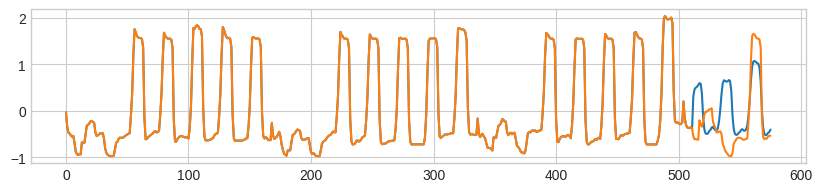

In [43]:
plt.figure(figsize=(10, 2))
plt.plot(np.concatenate([il[0]['target'], forecasts[0].samples[0]]))
plt.plot(np.concatenate([il[0]['target'], il[1]['target']]))

In [44]:
metrics = (
    evaluate_forecasts(
        forecasts,
        test_data=test_data,
        metrics=[
            MASE(),
            MeanWeightedSumQuantileLoss(np.arange(0.1, 1.0, 0.1)),
        ],
        batch_size=batch_size,
    )
    .reset_index(drop=True)
    .to_dict(orient="records")
)

1000it [00:00, 2874.32it/s]


In [45]:
metrics

[{'MASE[0.5]': 1.1644775308262405,
  'mean_weighted_sum_quantile_loss': 0.5841314419566315}]